In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
!pip install cartopy
import cartopy
import cartopy.crs as ccrs

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 59.2 MB/s eta 0:00:00


In [ ]:
df = pd.read_csv("/content/drive/MyDrive/Yeongsil_Miracle/mhw_event_all.csv")
df['date_peak'] = pd.to_datetime(df['date_peak'])
df['year'] = df['date_peak'].dt.year
df['month'] = df['date_peak'].dt.month
df['day'] = df['date_peak'].dt.day
def get_season(month):
    if 1 <= month <= 3:
        return 'JFM'
    elif 4 <= month <= 6:
        return 'AMJ'
    elif 7 <= month <= 9:
        return 'JAS'
    else:
        return 'OND'

def get_months(month):
    if 1 <= month <= 3:
        return '1 2 3'
    elif 4 <= month <= 6:
        return '4 5 6'
    elif 7 <= month <= 9:
        return '7 8 9'
    else:
        return '10 11 12'
df['season'] = df['month'].apply(get_season)
df['months_str'] = df['month'].apply(get_months)

,event_no,index_start,index_peak,index_end,duration,date_start,date_peak,date_end,intensity_mean,intensity_max,...,intensity_cumulative_abs,rate_onset,rate_decline,lat,long,year,month,day,season,months_str
0,1.0,320.0,322.0,329.0,10.0,1982-11-16,1982-11-18,1982-11-25,2.1306,2.5643,...,2910.5299,0.3049,0.1411,34.025002,125.974998,1982.0,11.0,18.0,OND,10 11 12
1,2.0,1823.0,1829.0,1833.0,11.0,1986-12-28,1987-01-03,1987-01-07,1.8540,2.6718,...,3167.5599,0.2166,0.3637,34.025002,125.974998,1987.0,1.0,3.0,JFM,1 2 3
2,3.0,1872.0,1878.0,1879.0,8.0,1987-02-15,1987-02-21,1987-02-22,1.5869,1.7383,...,2282.7399,0.0927,0.2571,34.025002,125.974998,1987.0,2.0,21.0,JFM,1 2 3
3,4.0,2192.0,2193.0,2200.0,9.0,1988-01-01,1988-01-02,1988-01-09,1.7021,2.0033,...,2588.9699,0.7687,0.1441,34.025002,125.974998,1988.0,1.0,2.0,JFM,1 2 3
4,5.0,2978.0,2981.0,2985.0,8.0,1990-02-25,1990-02-28,1990-03-04,2.4025,2.9784,...,2287.6699,0.4547,0.4137,34.025002,125.974998,1990.0,2.0,28.0,JFM,1 2 3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1380659,65.0,14437.0,14448.0,14467.0,31.0,2021-07-11,2021-07-22,2021-08-10,5.7408,7.7669,...,9227.2898,0.5009,0.2615,42.025002,133.975006,2021.0,7.0,22.0,JAS,7 8 9
1380660,66.0,14494.0,14499.0,14501.0,8.0,2021-09-06,2021-09-11,2021-09-13,2.1161,2.3536,...,2357.9499,0.1007,0.2562,42.025002,133.975006,2021.0,9.0,11.0,JAS,7 8 9
1380661,67.0,14505.0,14521.0,14536.0,32.0,2021-09-17,2021-10-03,2021-10-18,2.8982,4.1334,...,9354.7598,0.1392,0.1366,42.025002,133.975006,2021.0,10.0,3.0,OND,10 11 12
1380662,68.0,14543.0,14556.0,14579.0,37.0,2021-10-25,2021-11-07,2021-11-30,3.0550,4.1989,...,10550.7298,0.1427,0.1184,42.025002,133.975006,2021.0,11.0,7.0,OND,10 11 12


##Duration

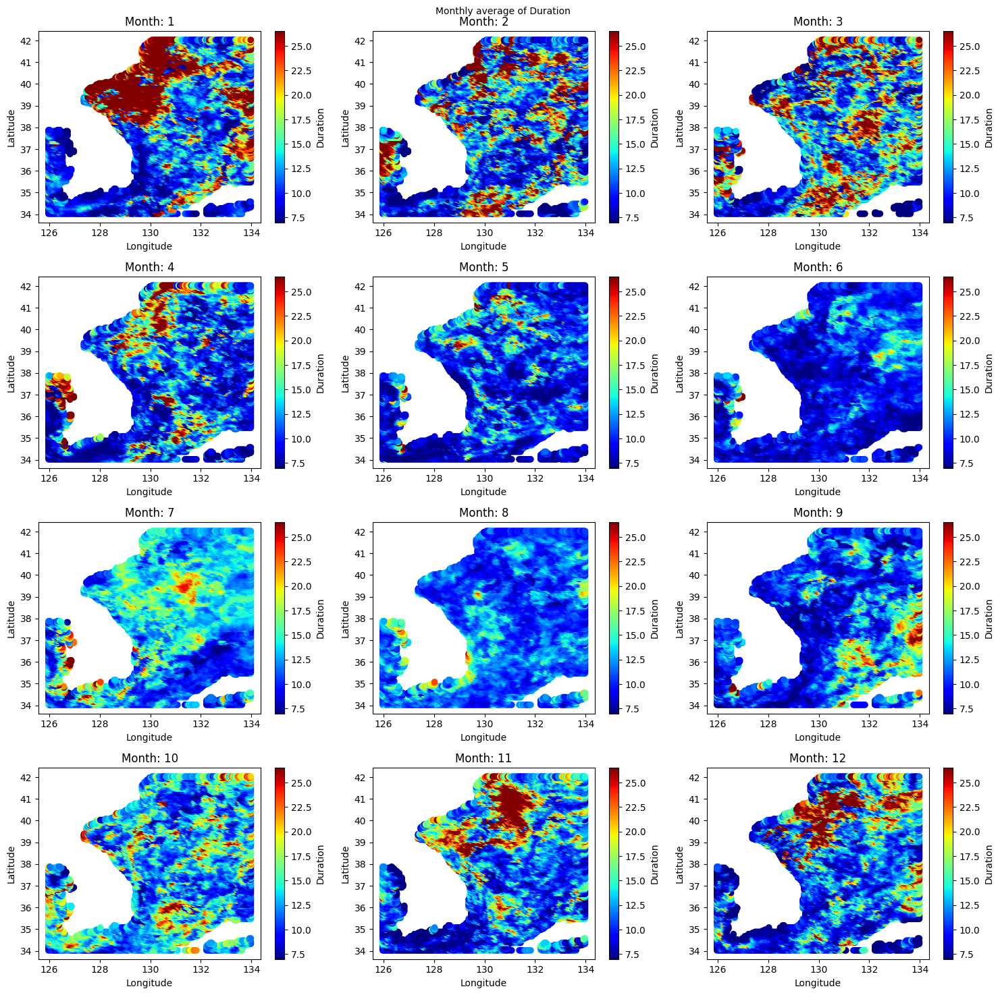

In [ ]:
result_duration = df.groupby(['lat', 'long', 'month'])['duration'].mean().reset_index()
lats = result_duration["lat"]
lons =result_duration["long"]
month = result_duration["month"]

cmap = plt.get_cmap('jet')
cbar_min = result_duration['duration'].quantile(0.05)
cbar_max = result_duration['duration'].quantile(0.95)

num_rows = 4
num_cols = 3
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15,15))
unique_months = result_duration['month'].unique()
for i, mon in enumerate(unique_months):
    row = i // num_cols
    col = i % num_cols
    mon = unique_months[i]
    subset_data = result_duration[result_duration['month'] == mon]
    plot_title = "Month: " + str(int(mon))
    scatter = axes[row, col].scatter( subset_data['long'],subset_data['lat'], c=subset_data['duration'],
                                     cmap=cmap)
    axes[row, col].set_title(plot_title)
    axes[row, col].set_xlabel('Longitude',fontsize= 10)
    axes[row, col].set_ylabel('Latitude',fontsize= 10)
    cbar = plt.colorbar(scatter, ax=axes[row, col])
    scatter.set_clim(cbar_min, cbar_max)
    cbar.set_label('Duration',fontsize= 10)
fig.suptitle("Monthly average of Duration", fontsize= 10)
plt.tight_layout()

##frequency

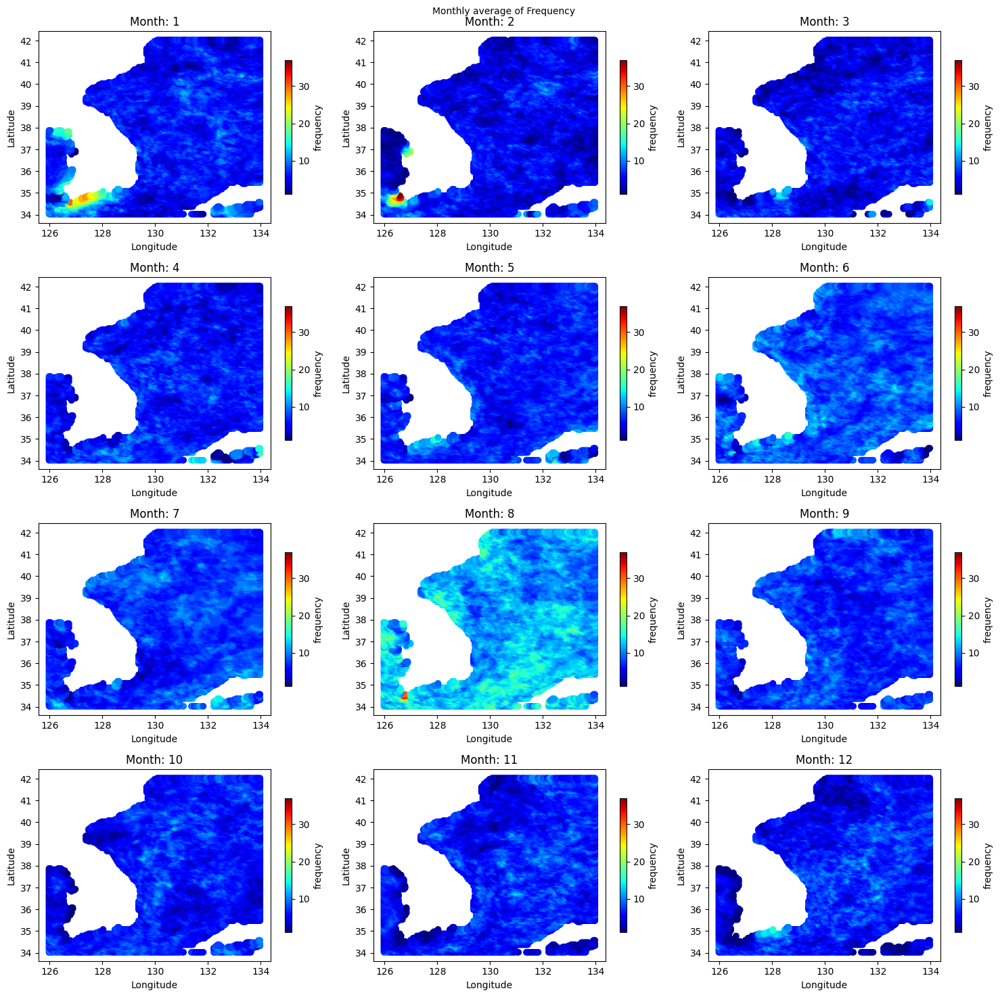

In [ ]:
result_frequency = df.groupby(['lat', 'long', 'month']).size().reset_index(name='frequency')
result_frequency = result_frequency.dropna()
lats = result_frequency ["lat"]
lons =result_frequency ["long"]

num_rows = 4
num_cols = 3
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))
unique_months = result_frequency ['month'].unique()
cmap = plt.get_cmap('jet')
cbar_min = result_frequency['frequency'].min()
cbar_max = result_frequency['frequency'].max()

for i, mon in enumerate(unique_months):
    row = i // num_cols
    col = i % num_cols
    mon = unique_months[i]
    subset_data = result_frequency [result_frequency ['month'] == mon]
    plot_title = "Month: " + str(int(mon))
    scatter = axes[row, col].scatter(subset_data['long'],subset_data['lat'], c=subset_data['frequency'],
                                     cmap=cmap)
    axes[row, col].set_title(plot_title)
    axes[row, col].set_xlabel('Longitude',fontsize= 10)
    axes[row, col].set_ylabel('Latitude',fontsize= 10)
    cbar = plt.colorbar(scatter, ax=axes[row, col] , shrink=0.7)
    scatter.set_clim(cbar_min, cbar_max)
    cbar.set_label('frequency')
fig.suptitle("Monthly average of Frequency", fontsize= 10)
plt.tight_layout()

#Mean Intensity  

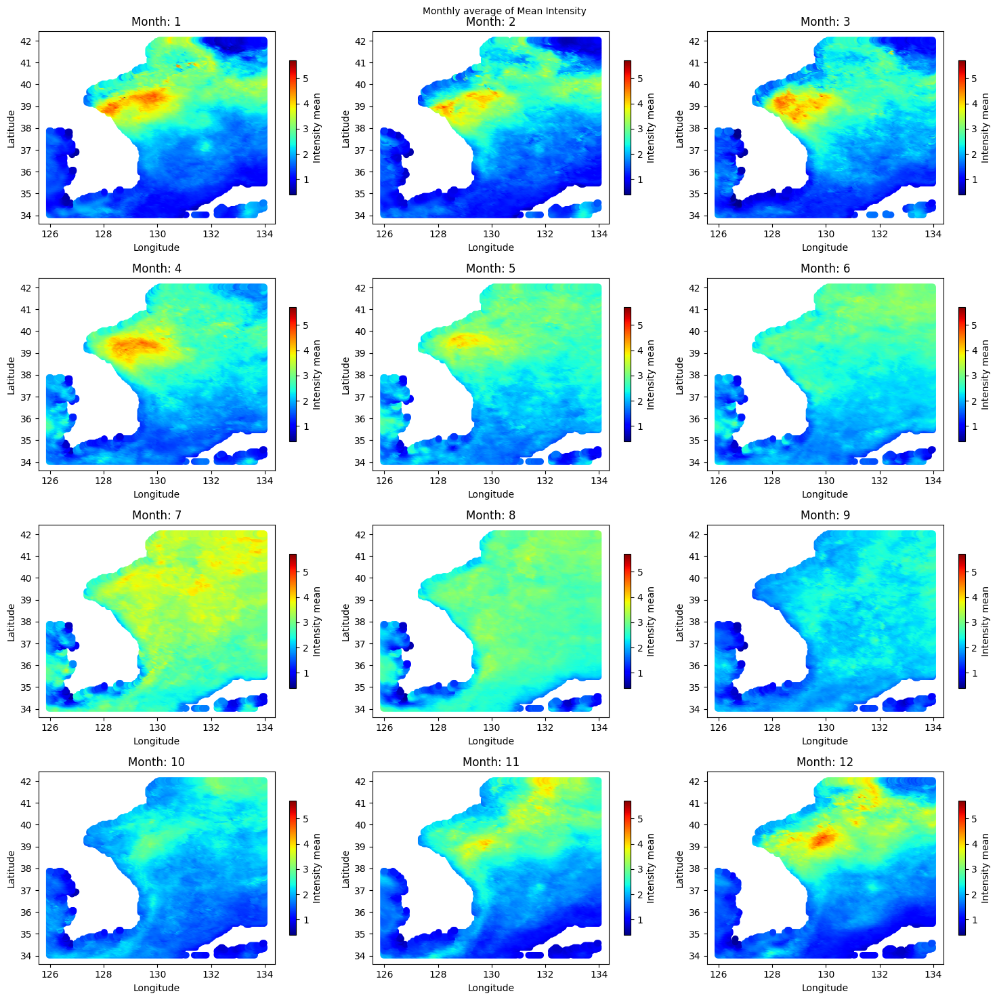

In [ ]:
result_Mean_Intensity = df.groupby(['lat', 'long', 'month'])['intensity_mean'].mean().reset_index()
lats = result_Mean_Intensity["lat"]
lons =result_Mean_Intensity["long"]

num_rows = 4
num_cols = 3
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15,15))
unique_months = result_Mean_Intensity['month'].unique()
cmap = plt.get_cmap('jet')
cbar_min =result_Mean_Intensity['intensity_mean'].min()
cbar_max =result_Mean_Intensity['intensity_mean'].max()
for i, mon in enumerate(unique_months):
    row = i // num_cols
    col = i % num_cols
    mon = unique_months[i]
    subset_data = result_Mean_Intensity[result_Mean_Intensity['month'] == mon]
    plot_title = "Month: " + str(int(mon))
    scatter = axes[row, col].scatter(subset_data['long'],subset_data['lat'],c=subset_data['intensity_mean'],cmap=cmap)
    axes[row, col].set_title(plot_title)
    axes[row, col].set_xlabel('Longitude')
    axes[row, col].set_ylabel('Latitude')
    cbar = plt.colorbar(scatter, ax=axes[row, col] , shrink=0.7)
    scatter.set_clim(cbar_min, cbar_max)
    cbar.set_label('Intensity mean')
fig.suptitle("Monthly average of Mean Intensity", fontsize= 10)
plt.tight_layout()

#Max Intensity  

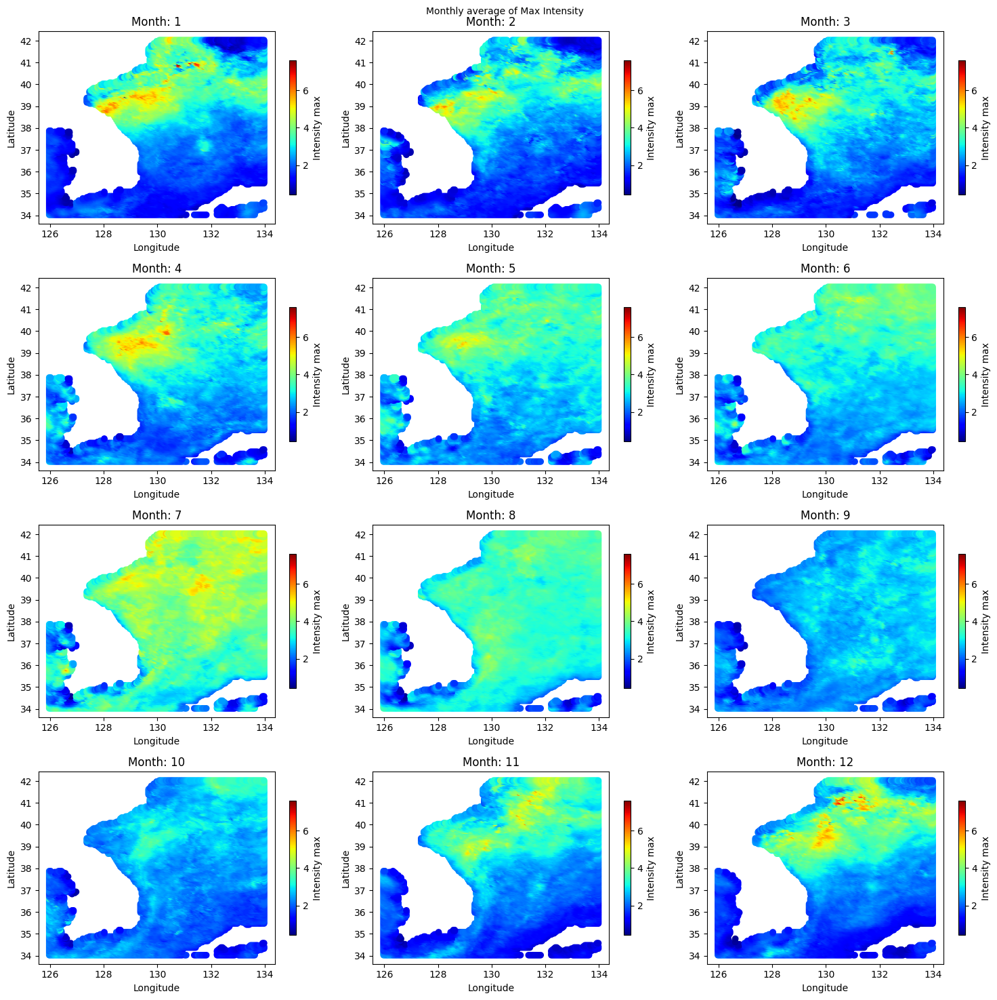

In [ ]:
result_Max_Intensity = df.groupby(['lat', 'long', 'month'])['intensity_max'].mean().reset_index()
lats = result_Max_Intensity["lat"]
lons =result_Max_Intensity["long"]

num_rows = 4
num_cols = 3
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15,15))
unique_months = result_Max_Intensity['month'].unique()
cmap = plt.get_cmap('jet')
cbar_min =result_Max_Intensity['intensity_max'].min()
cbar_max =result_Max_Intensity['intensity_max'].max()
for i, mon in enumerate(unique_months):
    row = i // num_cols
    col = i % num_cols
    mon = unique_months[i]
    subset_data = result_Max_Intensity[result_Max_Intensity['month'] == mon]
    plot_title = "Month: " + str(int(mon))
    scatter = axes[row, col].scatter(subset_data['long'], subset_data['lat'],
                                     c=subset_data['intensity_max'],cmap=cmap)
    axes[row, col].set_title(plot_title)
    axes[row, col].set_xlabel('Longitude')
    axes[row, col].set_ylabel('Latitude')
    cbar = plt.colorbar(scatter, ax=axes[row, col] , shrink=0.7)
    scatter.set_clim(cbar_min, cbar_max)
    cbar.set_label('Intensity max')
fig.suptitle("Monthly average of Max Intensity", fontsize= 10)
plt.tight_layout()

#intensity_var


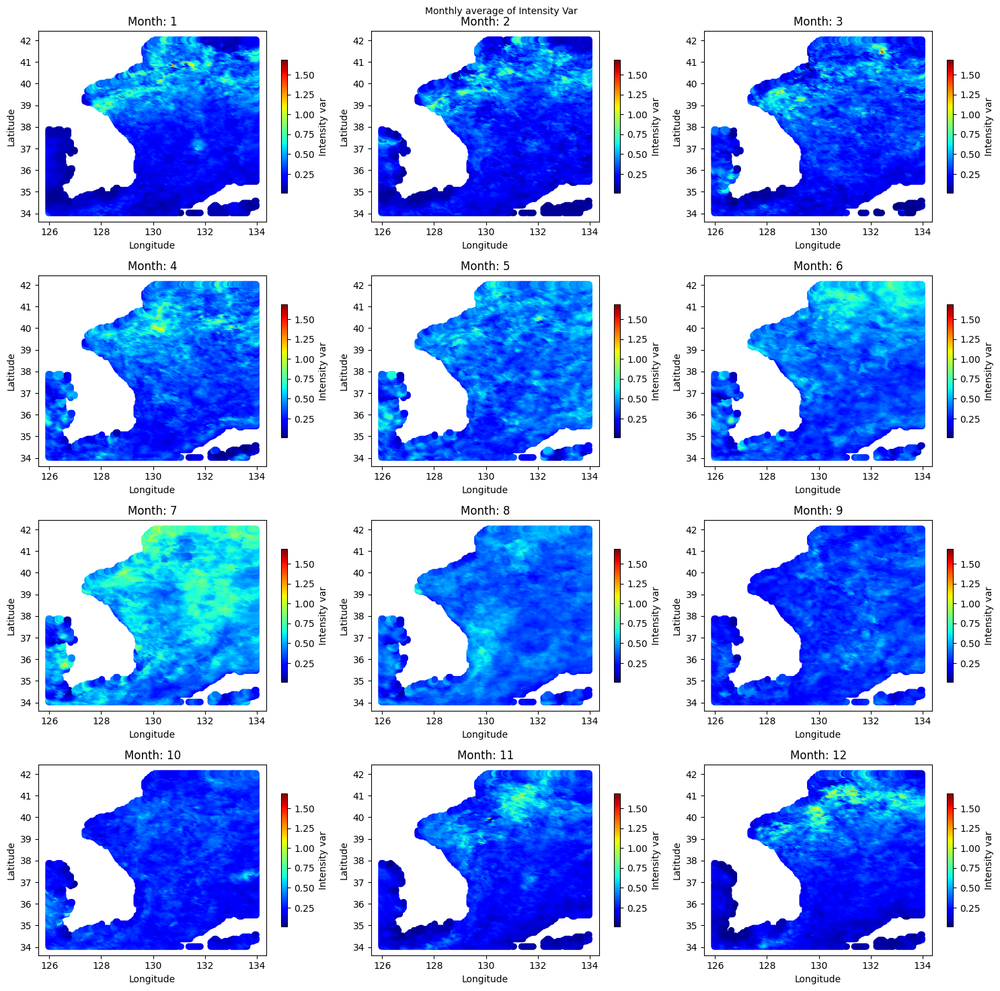

In [ ]:
result_intensity_var= df.groupby(['lat', 'long', 'month'])['intensity_var'].mean().reset_index()
lats = result_intensity_var["lat"]
lons =result_intensity_var["long"]

num_rows = 4
num_cols = 3
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15,15))
unique_months = result_intensity_var['month'].unique()
cmap = plt.get_cmap('jet')
cbar_min =result_intensity_var['intensity_var'].min()
cbar_max =result_intensity_var['intensity_var'].max()
for i, mon in enumerate(unique_months):
    row = i // num_cols
    col = i % num_cols
    mon = unique_months[i]
    subset_data = result_intensity_var[result_intensity_var['month'] == mon]
    plot_title = "Month: " + str(int(mon))
    scatter = axes[row, col].scatter(subset_data['long'], subset_data['lat'],
                                     c=subset_data['intensity_var'],cmap=cmap)
    axes[row, col].set_title(plot_title)
    axes[row, col].set_xlabel('Longitude')
    axes[row, col].set_ylabel('Latitude')
    cbar = plt.colorbar(scatter, ax=axes[row, col] , shrink=0.7)
    scatter.set_clim(cbar_min, cbar_max)
    cbar.set_label('Intensity var')
fig.suptitle("Monthly average of Intensity Var", fontsize= 10)
plt.tight_layout()

##intensity_cumulative

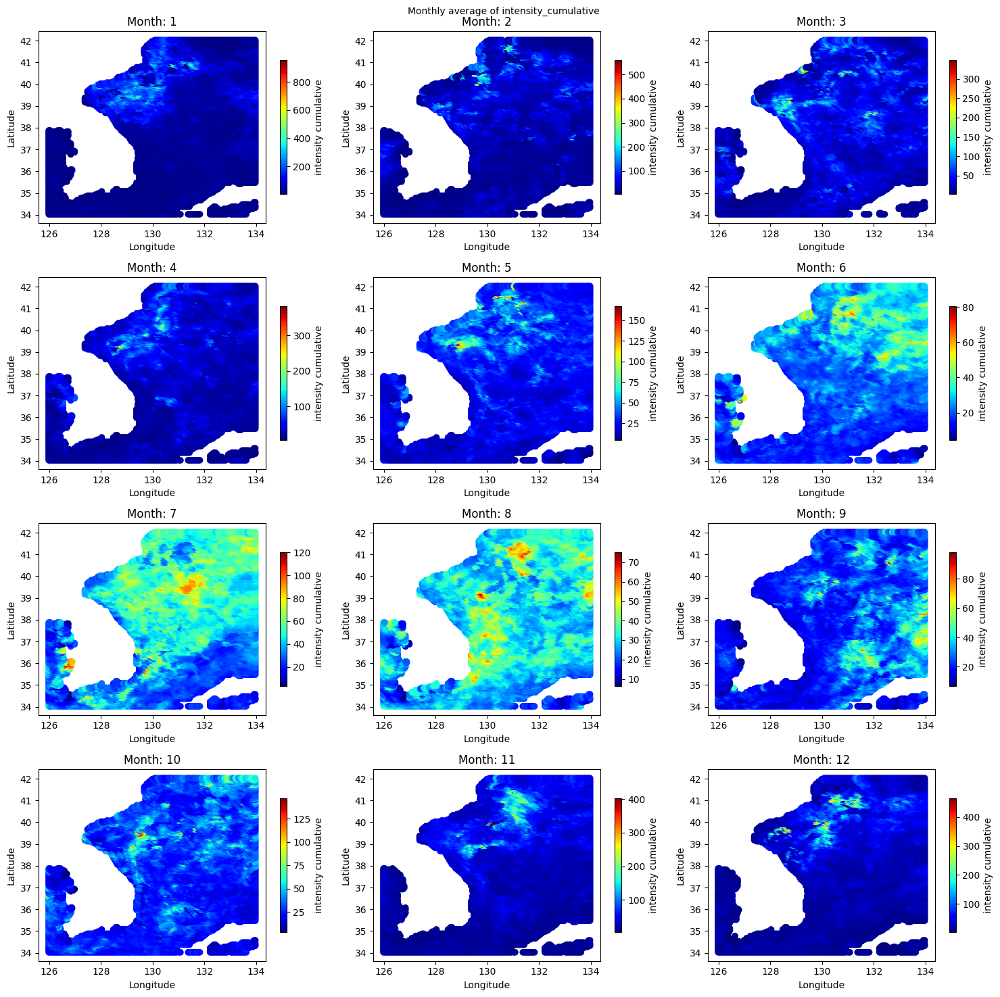

In [ ]:
result_intensity_cumulative= df.groupby(['lat', 'long', 'month'])['intensity_cumulative'].mean().reset_index()
lats =result_intensity_cumulative["lat"]
lons =result_intensity_cumulative["long"]

num_rows = 4
num_cols = 3
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15,15))
unique_months = result_intensity_cumulative['month'].unique()
cmap = plt.get_cmap('jet')
# cbar_min =  result_intensity_cumulative["intensity_cumulative"].min()
# cbar_max = result_intensity_cumulative["intensity_cumulative"].max()
for i, mon in enumerate(unique_months):
    row = i // num_cols
    col = i % num_cols
    mon = unique_months[i]
    subset_data = result_intensity_cumulative[result_intensity_cumulative['month'] == mon]
    plot_title = "Month: " + str(int(mon))
    scatter = axes[row, col].scatter(subset_data['long'], subset_data['lat'],
                                     c=subset_data['intensity_cumulative'],cmap=cmap)
    axes[row, col].set_title(plot_title)
    axes[row, col].set_xlabel('Longitude')
    axes[row, col].set_ylabel('Latitude')
    cbar = plt.colorbar(scatter, ax=axes[row, col] , shrink=0.7)
    # scatter.set_clim(cbar_min, cbar_max)
    cbar.set_label('intensity cumulative')
fig.suptitle("Monthly average of intensity_cumulative", fontsize= 10)
plt.tight_layout()

Hourly visualization

In [ ]:
df_ts = df.groupby(['year', "season",'months_str'])["duration" , 'intensity_max','intensity_mean','intensity_var'].mean().reset_index()
ts_event_no = df.groupby(['year', "season"])['event_no'].count()
df_ts['event_no_count'] = ts_event_no.values
df_ts

<ipython-input-12-e0c7b3ed3444>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df_ts = df.groupby(['year', "season",'months_str'])["duration" , 'intensity_max','intensity_mean','intensity_var'].mean().reset_index()


,year,season,months_str,duration,intensity_max,intensity_mean,intensity_var,event_no_count
0,1982.0,AMJ,4 5 6,6.185941,2.354105,1.946501,0.352132,441
1,1982.0,JAS,7 8 9,6.879877,2.514830,2.175333,0.278896,974
2,1982.0,JFM,1 2 3,7.768774,1.757929,1.593165,0.133363,2357
3,1982.0,OND,10 11 12,10.312139,1.968264,1.658235,0.193683,1557
4,1983.0,AMJ,4 5 6,7.677494,2.125651,1.640110,0.340789,431
...,...,...,...,...,...,...,...,...
155,2020.0,OND,10 11 12,11.924976,2.537392,2.149568,0.258242,10290
156,2021.0,AMJ,4 5 6,14.654700,2.947774,2.329770,0.385307,28439
157,2021.0,JAS,7 8 9,24.530361,4.561481,3.516612,0.693029,23418
158,2021.0,JFM,1 2 3,17.375008,2.745237,2.176019,0.355268,15061


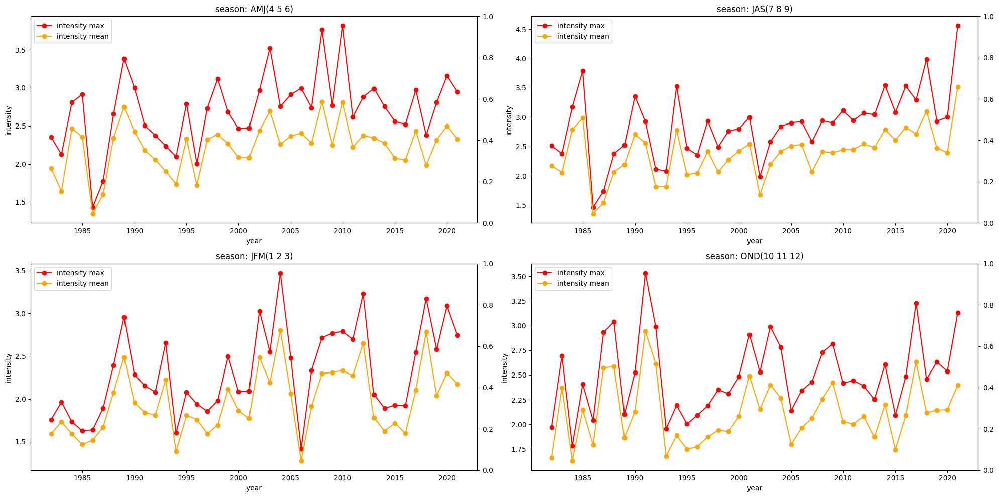

In [ ]:
num_rows = 2
num_cols = 2
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 10))
unique_season  = df_ts['season'].unique()
for i, season in enumerate(unique_season):
    row = i // num_cols
    col = i % num_cols
    season = unique_season[i]
    months = df_ts['months_str'].unique()[i]
    subset = df_ts[df_ts['season'] == season]
    plot_title = "season: " + str(season) + "(" + str(months) +")"
    axes[row, col].plot(subset["year"], subset['intensity_max'], marker='o', linestyle='-', color='r',label='intensity max')
    axes[row, col].plot(subset["year"], subset['intensity_mean'], marker='o', linestyle='-', color='orange',label='intensity mean')
    axes[row, col].twinx()
    axes[row, col].set_xlabel('year')
    axes[row, col].set_ylabel('intensity')
    axes[row, col].legend(loc='upper left')
    axes[row, col].set_title(plot_title)
plt.tight_layout()

year

In [ ]:
df_ts = df.groupby(['year'])["duration" , 'intensity_max','intensity_mean','intensity_var'].mean().reset_index()
ts_event_no = df.groupby(['year'])['event_no'].count()
df_ts['event_no_count'] = ts_event_no.values

<ipython-input-15-d5edfb4ee9ab>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df_ts = df.groupby(['year'])["duration" , 'intensity_max','intensity_mean','intensity_var'].mean().reset_index()


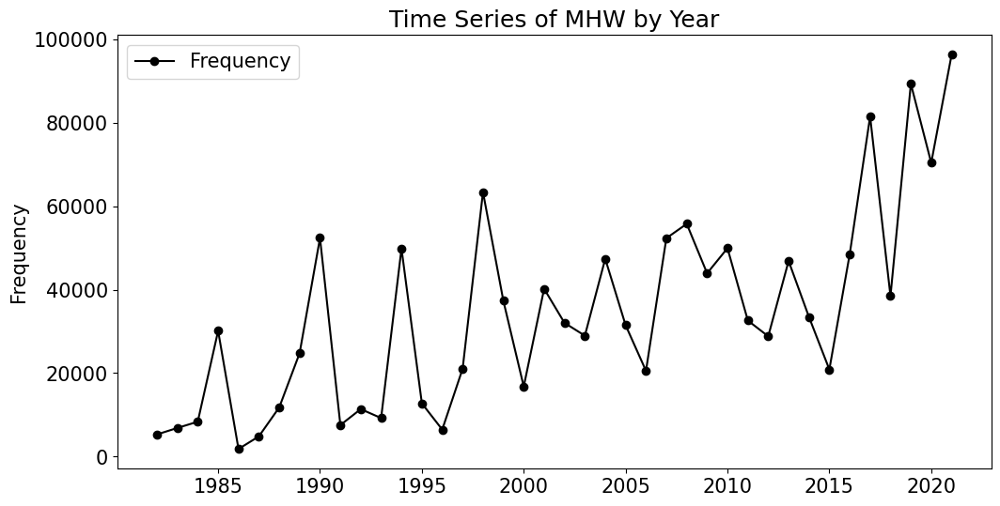

In [ ]:
fig, ax1 = plt.subplots(figsize=(12, 6))
plt.plot(df_ts["year"], df_ts['event_no_count'], marker='o', linestyle='-', color='k', label='Frequency')
plt.ylabel('Frequency')
plt.title('Time Series of MHW by Year')
plt.rcParams.update({'font.size': 15})
plt.legend(loc='upper left')
plt.show()

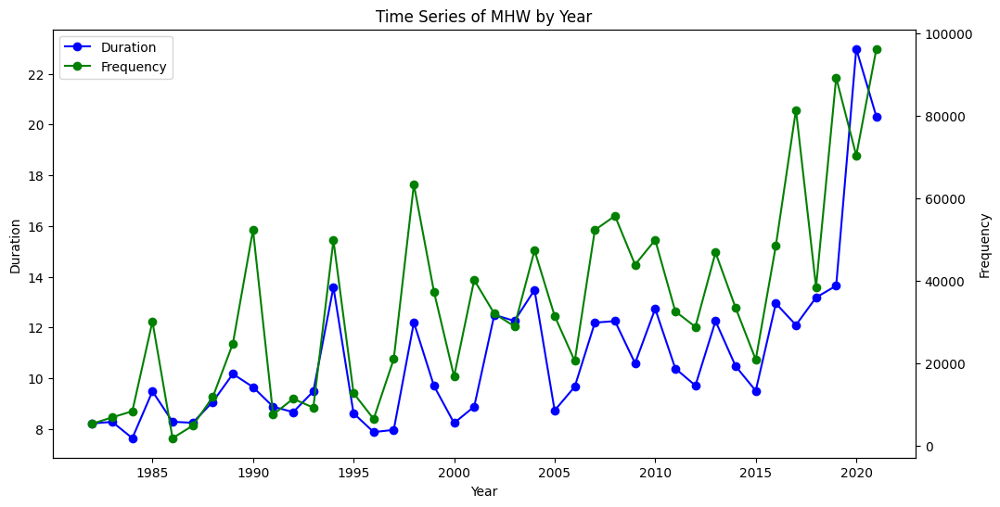

In [ ]:
fig, ax1 = plt.subplots(figsize=(12, 6))
ax1.plot(df_ts["year"], df_ts['duration'], marker='o', linestyle='-', color='b', label='Duration')
ax1.set_xlabel('Year' )
ax1.set_ylabel('Duration')
ax1.legend(loc='upper left')
ax2 = ax1.twinx()
ax2.plot(df_ts["year"], df_ts['event_no_count'], marker='o', linestyle='-', color='g', label='Frequency')
ax2.set_ylabel('Frequency')
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left')
plt.title('Time Series of MHW by Year')
plt.rcParams.update({'font.size': 15})
plt.show()

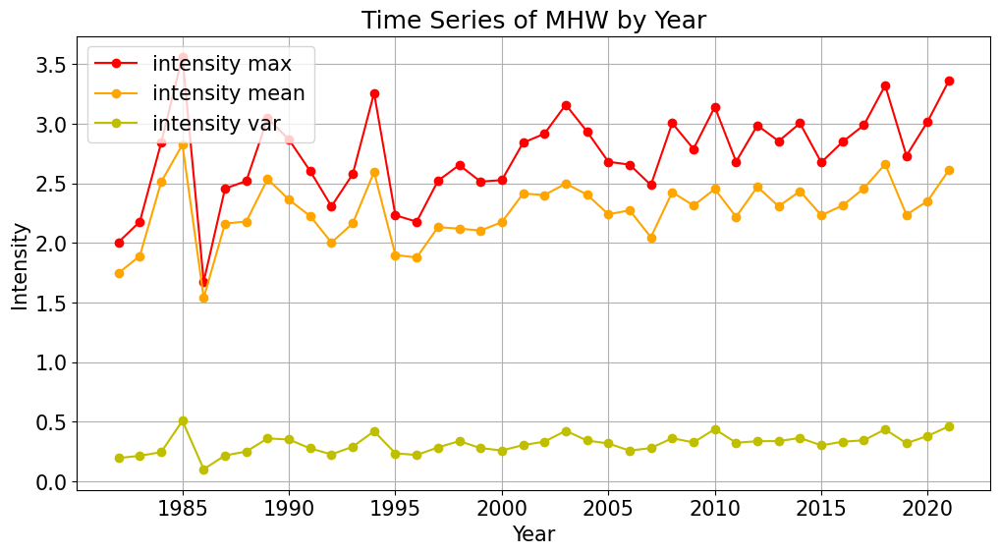

In [ ]:
plt.figure(figsize=(12, 6))
plt.plot(df_ts["year"], df_ts['intensity_max'], marker='o', linestyle='-', color='r',label='intensity max')
plt.plot(df_ts["year"], df_ts['intensity_mean'], marker='o', linestyle='-', color='orange',label='intensity mean')
plt.plot(df_ts["year"], df_ts['intensity_var'], marker='o', linestyle='-', color='y',label='intensity var')
plt.title('Time Series of MHW by Year')
plt.xlabel('Year')
plt.ylabel('Intensity')
plt.grid(True)
plt.legend(loc='upper left')
plt.rcParams.update({'font.size': 15})
plt.show()